In [183]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
from tabulate import tabulate

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib.ticker as ticker
import seaborn as sns

# Preprocesado y modelado
# ==============================================================================
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import make_blobs
from sklearn.metrics import euclidean_distances
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression 

from skopt.space import Real, Integer
from skopt.utils import use_named_args
from skopt import gp_minimize
from skopt.plots import plot_convergence

# Varios
# ==============================================================================
import multiprocessing
import random
from itertools import product
from scipy import stats
from fitter import Fitter, get_common_distributions

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_selector
from sklearn.metrics import log_loss

In [184]:
# Configuración matplotlib
# ==============================================================================
plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [185]:
url_train = 'https://raw.githubusercontent.com/SantiagoTadini/TP2-Datos/main/Features/data_train.csv'
url_test = 'https://raw.githubusercontent.com/SantiagoTadini/TP2-Datos/main/Features/data_test.csv'
url_test_kaggle = 'https://raw.githubusercontent.com/SantiagoTadini/TP2-Datos/main/Features/data_test_kaggle.csv'

data_train = pd.read_csv(url_train) #se usa para entrenar el modelo
data_test = pd.read_csv(url_test) #se usa para predecir
data_test_kaggle = pd.read_csv(url_test_kaggle) #se usa para predecir

In [186]:
data_train.head(4)

,ID,Region,Territory,"Pricing, Delivery_Terms_Quote_Appr","Pricing, Delivery_Terms_Approved",Bureaucratic_Code_0_Approval,Bureaucratic_Code_0_Approved,Bureaucratic_Code,Account_Created_Date,Source,...,Month,Delivery_Quarter,Delivery_Year,TRF,Total_Amount_Currency,Total_Amount,Total_Taxable_Amount_Currency,Total_Taxable_Amount,USD_Total_Amount,Target
0,12714.0,0.525322,0.304462,0.0,0.0,0.0,0.0,0.656989,735076.0,0.555541,...,10.0,0.640014,2018.0,2.0,0.535468,662287.5,0.533532,662287.5,777856.67,0.0
1,18684.0,0.573622,0.336735,1.0,1.0,1.0,1.0,0.500000,735255.0,0.492308,...,5.0,0.518212,2016.0,20.0,0.453838,9803430.0,0.454933,9803430.0,9803430.00,0.0
2,20675.0,0.408091,0.565700,1.0,0.0,1.0,0.0,0.215304,735102.0,0.555541,...,8.0,0.533714,2016.0,0.0,0.453838,170931.6,0.454933,341863.2,170931.60,0.0
3,20682.0,0.408091,0.565700,1.0,0.0,1.0,0.0,0.215304,735102.0,0.555541,...,7.0,0.533714,2016.0,0.0,0.453838,170931.6,0.454933,341863.2,170931.60,0.0


In [187]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13446 entries, 0 to 13445
Data columns (total 45 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   ID                                  13446 non-null  float64
 1   Region                              13446 non-null  float64
 2   Territory                           13446 non-null  float64
 3   Pricing, Delivery_Terms_Quote_Appr  13446 non-null  float64
 4   Pricing, Delivery_Terms_Approved    13446 non-null  float64
 5   Bureaucratic_Code_0_Approval        13446 non-null  float64
 6   Bureaucratic_Code_0_Approved        13446 non-null  float64
 7   Bureaucratic_Code                   13446 non-null  float64
 8   Account_Created_Date                13446 non-null  float64
 9   Source                              13446 non-null  float64
 10  Billing_Country                     13446 non-null  float64
 11  Account_Name                        13446

In [188]:
# Dimensiones del dataset
# ==============================================================================
data_train.shape

(13446, 45)

In [189]:
# Número de datos ausentes por variable
# ==============================================================================
data_train.isna().sum().sort_values()

ID                                    0
Currency                              0
Quote_Expiry_Date                     0
Last_Modified_Date                    0
Last_Modified_By                      0
Product_Family                        0
Product_Name                          0
ASP_Currency                          0
ASP                                   0
ASP_(converted_USD)                   0
Planned_Delivery_Start_Date           0
Planned_Delivery_End_Date             0
Month                                 0
Delivery_Quarter                      0
Delivery_Year                         0
TRF                                   0
Total_Amount_Currency                 0
Total_Amount                          0
Total_Taxable_Amount_Currency         0
Total_Taxable_Amount                  0
Product_Category_B                    0
USD_Total_Amount                      0
Size                                  0
Brand                                 0
Region                                0


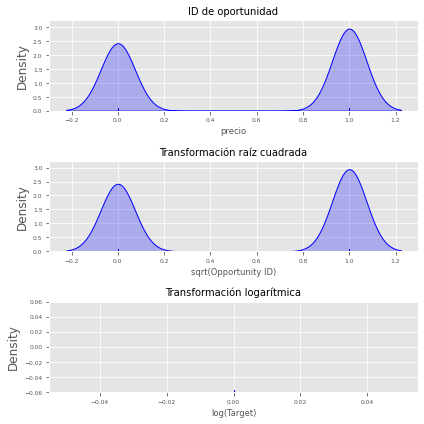

In [190]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(6, 6))
sns.distplot(
    data_train.Target,
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[0]
)
axes[0].set_title("ID de oportunidad", fontsize = 'medium')
axes[0].set_xlabel('precio', fontsize='small') 
axes[0].tick_params(labelsize = 6)

sns.distplot(
    np.sqrt(data_train.Target),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[1]
)
axes[1].set_title("Transformación raíz cuadrada", fontsize = 'medium')
axes[1].set_xlabel('sqrt(Opportunity ID)', fontsize='small') 
axes[1].tick_params(labelsize = 6)

sns.distplot(
    np.log(data_train.Target),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[2]
)
axes[2].set_title("Transformación logarítmica", fontsize = 'medium')
axes[2].set_xlabel('log(Target)', fontsize='small') 
axes[2].tick_params(labelsize = 6)

fig.tight_layout()

In [212]:
# Reparto de datos en train y test
# ==============================================================================
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
                                        data_train.drop('Target', axis='columns'),
                                        data_train['Target'],
                                        train_size   = 0.8,
                                        random_state = 123,
                                        shuffle      = True,
                                        test_size   = 0.2
                                        )

In [213]:
X_train

,ID,Region,Territory,"Pricing, Delivery_Terms_Quote_Appr","Pricing, Delivery_Terms_Approved",Bureaucratic_Code_0_Approval,Bureaucratic_Code_0_Approved,Bureaucratic_Code,Account_Created_Date,Source,...,Planned_Delivery_End_Date,Month,Delivery_Quarter,Delivery_Year,TRF,Total_Amount_Currency,Total_Amount,Total_Taxable_Amount_Currency,Total_Taxable_Amount,USD_Total_Amount
1168,20097.0,0.525322,0.582124,1.0,0.0,1.0,0.0,0.215304,735359.0,0.555541,...,736176.0,7.0,0.533714,2016.0,10.0,0.535468,5012475.00,0.533532,5012475.0,5887151.89
6586,22811.0,0.573622,0.612004,1.0,1.0,1.0,1.0,0.337143,735495.0,0.549957,...,736419.0,3.0,0.514866,2017.0,0.0,0.734807,190820.00,0.737037,547785.0,136629.03
2516,20625.0,0.525322,0.683544,0.0,0.0,0.0,0.0,0.656989,735396.0,0.549957,...,736120.0,5.0,0.518212,2016.0,0.0,0.535468,89505.00,0.533532,89505.0,105123.62
6615,22794.0,0.573622,0.612004,1.0,0.0,1.0,0.0,0.215304,735495.0,0.549957,...,736419.0,3.0,0.514866,2017.0,0.0,0.734807,95410.00,0.737037,1298464.3,68314.51
3540,23325.0,0.655876,0.582124,1.0,1.0,0.0,0.0,0.656989,735134.0,0.778452,...,736206.0,8.0,0.533714,2016.0,0.0,0.662797,23400.00,0.661965,27400.0,221.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5218,15126.0,0.655876,0.819672,1.0,0.0,0.0,0.0,0.215304,736100.0,0.555541,...,736807.0,4.0,0.518212,2018.0,2.0,0.662797,83536920.00,0.661965,83536920.0,791930.00
12252,9681.0,0.573622,0.959302,1.0,1.0,1.0,1.0,0.656989,735992.0,0.555541,...,736725.0,1.0,0.514866,2018.0,0.0,0.453838,3682.80,0.454933,39805.5,3682.80
1346,26059.0,0.655876,0.582124,1.0,0.0,1.0,0.0,0.215304,735708.0,0.555541,...,736083.0,4.0,0.518212,2016.0,0.0,0.662797,6200.00,0.661965,1071480.0,58.78
11646,10679.0,0.408091,0.320755,1.0,1.0,1.0,1.0,0.656989,736669.0,0.555541,...,736716.0,1.0,0.514866,2018.0,1.0,0.453838,496955.25,0.454933,0.0,496955.25


In [193]:
y_train

1168     0.0
6586     1.0
2516     0.0
6615     1.0
3540     1.0
        ... 
5218     1.0
12252    1.0
1346     0.0
11646    1.0
3582     1.0
Name: Target, Length: 10756, dtype: float64

In [194]:
print("Partición de entrenamento")
print("-----------------------")
print(y_train.describe())

Partición de entrenamento
-----------------------
count    10756.000000
mean         0.546300
std          0.497875
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: Target, dtype: float64


In [195]:
print("Partición de test")
print("-----------------------")
print(y_test.describe())

Partición de test
-----------------------
count    2690.000000
mean        0.558736
std         0.496630
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: Target, dtype: float64


In [196]:
# Selección de las variables por típo
# ==============================================================================
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_selector

# Se estandarizan las columnas numéricas y se hace one-hot-encoding de las 
# columnas cualitativas. Para mantener las columnas a las que no se les aplica 
# ninguna transformación se tiene que indicar remainder='passthrough'.
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()

preprocessor = ColumnTransformer(
                   [('scale', StandardScaler(), numeric_cols),
                    ('onehot', OneHotEncoder(handle_unknown='ignore'), cat_cols)])

In [197]:
X_train_prep = preprocessor.fit_transform(X_train)
X_test_prep  = preprocessor.transform(X_test)

In [198]:
# Convertir el output en dataframe y añadir el nombre de las columnas
# ==============================================================================
#encoded_cat = preprocessor.named_transformers_['onehot'].get_feature_names(cat_cols)
labels = np.concatenate([numeric_cols])
datos_train_prep = preprocessor.transform(X_train)
datos_train_prep = pd.DataFrame(datos_train_prep,columns=labels)
datos_train_prep.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10756 entries, 0 to 10755
Data columns (total 44 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   ID                                  10756 non-null  float64
 1   Region                              10756 non-null  float64
 2   Territory                           10756 non-null  float64
 3   Pricing, Delivery_Terms_Quote_Appr  10756 non-null  float64
 4   Pricing, Delivery_Terms_Approved    10756 non-null  float64
 5   Bureaucratic_Code_0_Approval        10756 non-null  float64
 6   Bureaucratic_Code_0_Approved        10756 non-null  float64
 7   Bureaucratic_Code                   10756 non-null  float64
 8   Account_Created_Date                10756 non-null  float64
 9   Source                              10756 non-null  float64
 10  Billing_Country                     10756 non-null  float64
 11  Account_Name                        10756

In [199]:
from sklearn.linear_model import Ridge

# Preprocedado
# ==============================================================================

# Identificación de columnas numéricas y categóricas
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()


# Transformaciones para las variables numéricas
numeric_transformer = Pipeline(
                        steps=[('scaler', StandardScaler())]
                      )

# Transformaciones para las variables categóricas
categorical_transformer = Pipeline(
                            steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]
                          )

preprocessor = ColumnTransformer(
                    transformers=[
                        ('numeric', numeric_transformer, numeric_cols),
                        ('cat', categorical_transformer, cat_cols)
                    ],
                    remainder='passthrough'
                )

# Pipeline
# ==============================================================================

# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', Ridge())])

# Train
# ==============================================================================
# Se asigna el resultado a _ para que no se imprima por pantalla
_ = pipe.fit(X=X_train, y=y_train)

In [200]:
# Validación cruzada
# ==============================================================================
from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(
                estimator = pipe,
                X         = X_train,
                y         = y_train,
                scoring   = 'neg_root_mean_squared_error',
                cv        = 5
             )

print(f"Métricas validación cruzada: {cv_scores}")
print(f"Média métricas de validación cruzada: {cv_scores.mean()}")

Métricas validación cruzada: [-0.3314366  -0.32406446 -0.32872542 -0.32995747 -0.34140009]
Média métricas de validación cruzada: -0.3311168097555223


In [201]:
# Validación cruzada repetida
# ==============================================================================
from sklearn.model_selection import RepeatedKFold

cv = RepeatedKFold(n_splits=5, n_repeats=5, random_state=123)
cv_scores = cross_val_score(
                estimator = pipe,
                X         = X_train,
                y         = y_train,
                scoring   = 'neg_root_mean_squared_error',
                cv        = cv
             )

print(f"Métricas de validación cruzada: {cv_scores}")
print("")
print(f"Média métricas de validación cruzada: {cv_scores.mean()}")

Métricas de validación cruzada: [-0.3327187  -0.3374471  -0.32736863 -0.32764535 -0.32975373 -0.33030041
 -0.33615941 -0.32652486 -0.32980215 -0.33016427 -0.33724502 -0.33365981
 -0.3240372  -0.38406023 -0.32627303 -0.32471553 -0.3290584  -0.33724318
 -0.32633597 -0.33896583 -0.33004746 -0.32396727 -0.32864375 -0.39381878
 -0.33089714]

Média métricas de validación cruzada: -0.33507412907630646


In [202]:
# Validación cruzada repetida con múltiples métricas
# ==============================================================================
from sklearn.model_selection import cross_validate

cv = RepeatedKFold(n_splits=3, n_repeats=5, random_state=123)
cv_scores = cross_validate(
                estimator = pipe,
                X         = X_train,
                y         = y_train,
                scoring   = ('r2', 'neg_root_mean_squared_error'),
                cv        = cv,
                return_train_score = True
            )

# Se convierte el diccionario a dataframe para facilitar la visualización
cv_scores = pd.DataFrame(cv_scores)
cv_scores

,fit_time,score_time,test_r2,train_r2,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,0.031513,0.006562,0.540741,0.575156,-0.337335,-0.324525
1,0.032010,0.007005,0.571224,0.561578,-0.324873,-0.330089
2,0.028374,0.006995,0.560723,0.567442,-0.330804,-0.326879
3,0.025301,0.007001,0.552960,0.569870,-0.332921,-0.326487
4,0.024999,0.007000,0.561758,0.567409,-0.329445,-0.327509
5,0.029002,0.007998,0.557916,0.567573,-0.331095,-0.327345
6,0.031999,0.008999,0.551430,0.573530,-0.333109,-0.325269
7,0.029998,0.008000,0.566557,0.565882,-0.327776,-0.328019
8,0.064998,0.007998,0.438697,0.565560,-0.373313,-0.327991
9,0.037997,0.008000,0.565877,0.565986,-0.328191,-0.327896


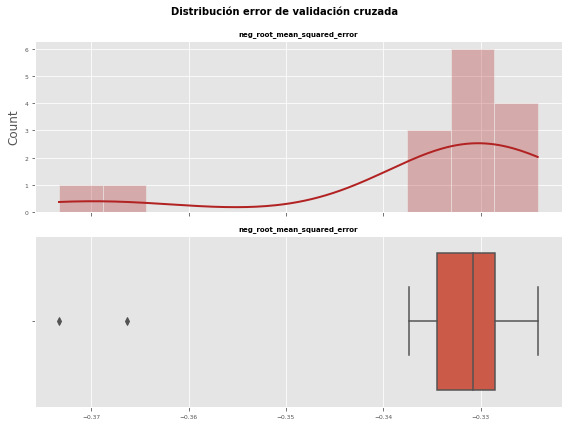

In [203]:
# Distribución del error de validación cruzada
# ==============================================================================
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 6), sharex=True)

sns.histplot(
    data    = cv_scores['test_neg_root_mean_squared_error'],
    stat    = "count",
    kde     = True,
    line_kws= {'linewidth': 2},
    color   = "firebrick",
    alpha   = 0.3,
    ax      = axes[0]
)

axes[0].set_title('neg_root_mean_squared_error', fontsize = 7, fontweight = "bold")
axes[0].tick_params(labelsize = 6)
axes[0].set_xlabel("")
    
sns.boxplot(
    cv_scores['test_neg_root_mean_squared_error'],
    ax      = axes[1]
)
axes[1].set_title('neg_root_mean_squared_error', fontsize = 7, fontweight = "bold")
axes[1].tick_params(labelsize = 6)
axes[1].set_xlabel("")


fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Distribución error de validación cruzada', fontsize = 10,
             fontweight = "bold");

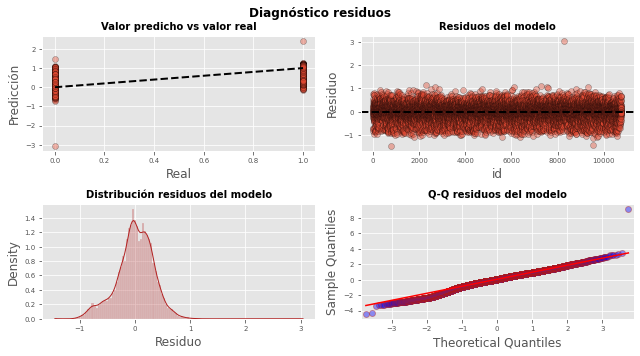

In [204]:
# Diagnóstico errores (residuos) de las predicciones de validación cruzada
# ==============================================================================
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
import statsmodels.api as sm

# Validación cruzada
# ==============================================================================
cv = KFold(n_splits=5, random_state=123, shuffle=True)
cv_prediccones = cross_val_predict(
                    estimator = pipe,
                    X         = X_train,
                    y         = y_train,
                    cv        = cv
                  )

# Gráficos
# ==============================================================================
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9, 5))

axes[0, 0].scatter(y_train, cv_prediccones, edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()],
                'k--', color = 'black', lw=2)
axes[0, 0].set_title('Valor predicho vs valor real', fontsize = 10, fontweight = "bold")
axes[0, 0].set_xlabel('Real')
axes[0, 0].set_ylabel('Predicción')
axes[0, 0].tick_params(labelsize = 7)

axes[0, 1].scatter(list(range(len(y_train))), y_train - cv_prediccones,
                   edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 1].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
axes[0, 1].set_title('Residuos del modelo', fontsize = 10, fontweight = "bold")
axes[0, 1].set_xlabel('id')
axes[0, 1].set_ylabel('Residuo')
axes[0, 1].tick_params(labelsize = 7)

sns.histplot(
    data    = y_train - cv_prediccones,
    stat    = "density",
    kde     = True,
    line_kws= {'linewidth': 1},
    color   = "firebrick",
    alpha   = 0.3,
    ax      = axes[1, 0]
)

axes[1, 0].set_title('Distribución residuos del modelo', fontsize = 10,
                     fontweight = "bold")
axes[1, 0].set_xlabel("Residuo")
axes[1, 0].tick_params(labelsize = 7)


sm.qqplot(
    y_train - cv_prediccones,
    fit   = True,
    line  = 'q',
    ax    = axes[1, 1], 
    color = 'firebrick',
    alpha = 0.4,
    lw    = 2
)
axes[1, 1].set_title('Q-Q residuos del modelo', fontsize = 10, fontweight = "bold")
axes[1, 1].tick_params(labelsize = 7)

fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Diagnóstico residuos', fontsize = 12, fontweight = "bold");

In [205]:
predicciones = pipe.predict(X_test)
# Se crea un dataframe con las predicciones y el valor real
df_predicciones = pd.DataFrame({'Target' : y_test, 'prediccion' : predicciones})
df_predicciones

,Target,prediccion
9137,1.0,0.765800
2798,1.0,0.985680
10108,0.0,0.071487
6982,1.0,1.088885
3933,1.0,1.029384
...,...,...
9771,1.0,0.985394
8595,1.0,1.070554
2975,1.0,1.031647
233,0.0,-0.160005


In [206]:
from sklearn.model_selection import GridSearchCV, RepeatedKFold
from sklearn.linear_model import Ridge

# Pipe: preprocesado + modelo
# ==============================================================================
# Identificación de columnas numéricas y catégoricas
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()


# Transformaciones para las variables numéricas
numeric_transformer = Pipeline(
                        steps=[('scaler', StandardScaler())]
                      )

# Transformaciones para las variables categóricas
categorical_transformer = Pipeline(
                            steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]
                          )

preprocessor = ColumnTransformer(
                    transformers=[
                        ('numeric', numeric_transformer, numeric_cols),
                        ('cat', categorical_transformer, cat_cols)
                    ],
                    remainder='passthrough'
                )

# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', Ridge())])

# Grid de hiperparámetros
# ==============================================================================
param_grid = {'modelo__alpha': np.logspace(-5, 3, 10)}

# Búsqueda por validación cruzada
# ==============================================================================
grid = GridSearchCV(
        estimator  = pipe,
        param_grid = param_grid,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits = 5, n_repeats = 3), 
        verbose    = 0,
        return_train_score = True
        )

# Se asigna el resultado a _ para que no se imprima por pantalla
_= grid.fit(X = X_train, y = y_train)

In [207]:
# Resultados del grid
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)

,param_modelo__alpha,mean_test_score,std_test_score,mean_train_score,std_train_score
8,129.155,-0.333483,0.016109,-0.327568,0.001361
7,16.681,-0.334051,0.016499,-0.327363,0.001365
0,1e-05,-0.334109,0.016275,-0.327318,0.001361
1,7.74264e-05,-0.334109,0.016275,-0.327318,0.001361
2,0.000599484,-0.334109,0.016275,-0.327318,0.001361
3,0.00464159,-0.334109,0.016275,-0.327318,0.001361
4,0.0359381,-0.334109,0.016277,-0.327318,0.001361
5,0.278256,-0.334111,0.016294,-0.327318,0.001361
6,2.15443,-0.334121,0.016382,-0.327324,0.001361
9,1000,-0.335206,0.015068,-0.330561,0.001316


In [208]:
# Mejores hiperparámetros
# ==============================================================================
print("-----------------------------------")
print("Mejores hiperparámetros encontrados")
print("-----------------------------------")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

-----------------------------------
Mejores hiperparámetros encontrados
-----------------------------------
{'modelo__alpha': 129.15496650148827} : -0.33348274298961006 neg_root_mean_squared_error


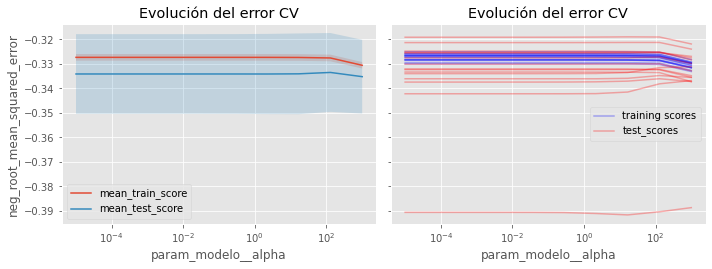

In [209]:
# Gráfico resultados validación cruzada para cada hiperparámetro
# ==============================================================================
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3.84), sharey=True)

# Gráfico 1
# ------------------------------------------------------------------------------
resultados.plot('param_modelo__alpha', 'mean_train_score', ax=axes[0])
resultados.plot('param_modelo__alpha', 'mean_test_score', ax=axes[0])
axes[0].fill_between(resultados.param_modelo__alpha.astype(np.float),
                resultados['mean_train_score'] + resultados['std_train_score'],
                resultados['mean_train_score'] - resultados['std_train_score'],
                alpha=0.2)
axes[0].fill_between(resultados.param_modelo__alpha.astype(np.float),
                resultados['mean_test_score'] + resultados['std_test_score'],
                resultados['mean_test_score'] - resultados['std_test_score'],
                alpha=0.2)
axes[0].legend()
axes[0].set_xscale('log')
axes[0].set_title('Evolución del error CV')
axes[0].set_ylabel('neg_root_mean_squared_error');

# Gráfico 2
# ------------------------------------------------------------------------------
numero_splits = grid.n_splits_

resultados.plot(
    x     = 'param_modelo__alpha',
    y     = [f'split{i}_train_score' for i in range(numero_splits)],
    alpha = 0.3,
    c     = 'blue', 
    ax    = axes[1]
)

resultados.plot(
    x     = 'param_modelo__alpha',
    y     = [f'split{i}_test_score' for i in range(numero_splits)],
    alpha = 0.3,
    c     = 'red', 
    ax    = axes[1]
)

axes[1].legend(
    (axes[1].get_children()[0], axes[1].get_children()[numero_splits]),
    ('training scores', 'test_scores')
)
axes[1].set_xscale('log')
axes[1].set_title('Evolución del error CV')
axes[1].set_ylabel('neg_root_mean_squared_error');

fig.tight_layout()

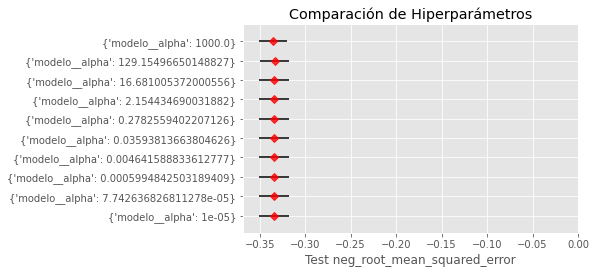

In [210]:
fig, ax = plt.subplots(figsize=(6, 3.84))
ax.barh(
    [str(d) for d in resultados['params']],
    resultados['mean_test_score'],
    xerr=resultados['std_test_score'],
    align='center',
    alpha=0
)
ax.plot(
    resultados['mean_test_score'],
    [str(d) for d in resultados['params']],
    marker="D",
    linestyle="",
    alpha=0.8,
    color="r"
)
ax.set_title('Comparación de Hiperparámetros')
ax.set_xlabel('Test neg_root_mean_squared_error');

In [244]:
from sklearn.model_selection import RandomizedSearchCV, RepeatedKFold
from sklearn.neighbors import KNeighborsRegressor

# Pipeline: preprocesado + modelo
# ==============================================================================
# Identificación de columnas numéricas y catégoricas
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()


# Transformaciones para las variables numéricas
numeric_transformer = Pipeline(
                        steps=[('scaler', StandardScaler())]
                      )

# Transformaciones para las variables categóricas
categorical_transformer = Pipeline(
                            steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]
                          )

preprocessor = ColumnTransformer(
                    transformers=[
                        ('numeric', numeric_transformer, numeric_cols),
                        ('cat', categorical_transformer, cat_cols)
                    ],
                    remainder='passthrough'
                )

# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline.
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', KNeighborsRegressor())])

# Optimización de hiperparámetros
# ==============================================================================
# Espacio de búsqueda de cada hiperparámetro
param_distributions = {'modelo__n_neighbors': np.linspace(1, 100, 800, dtype=int)}

# Búsqueda random grid
grid = RandomizedSearchCV(
        estimator  = pipe,
        param_distributions = param_distributions,
        n_iter     = 50,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits = 5, n_repeats = 2), 
        refit      = True, 
        verbose    = 0,
        random_state = 0,
        return_train_score = True
       )

grid.fit(X = X_train, y = y_train)

# Resultados del grid
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)\
    .head(1)

NameError: name 'int64' is not defined

In [234]:
# Sacamos el y_test_de_practica_agrupado_por_opp
oportunidades_test_de_practica = X_test['Opportunity_ID']
oportunidades_test_de_practica = oportunidades_test_de_practica.to_frame()
stage_test_de_practica = y_test.to_frame()

oportunidades_test_de_practica['Target'] = stage_test_de_practica
y_test_agrupado_por_opp = oportunidades_test_de_practica.groupby('Opportunity_ID').agg({'Target' : 'mean'})
y_test_agrupado_por_opp = y_test_agrupado_por_opp.reset_index()

In [215]:
from sklearn.metrics import mean_squared_error
# Error de test del modelo final
# ==============================================================================
modelo_final = grid.best_estimator_
predicciones = modelo_final.predict(X = X_test)
rmse_knn = mean_squared_error(
            y_true  = y_test,
            y_pred  = predicciones,
            squared = False
           )
print(f"El error (rmse) de test es: {rmse_knn}")

El error (rmse) de test es: 0.2691642641101088


In [235]:
# Sacamos el preds_agrupado_por_opp
oportunidades_test_de_practica = X_test['Opportunity_ID']
oportunidades_test_de_practica = oportunidades_test_de_practica.to_frame()

oportunidades_test_de_practica['Target'] = predicciones

preds_agrupado_por_opp = oportunidades_test_de_practica.groupby('Opportunity_ID').agg({'Target':'mean'})
preds_agrupado_por_opp = preds_agrupado_por_opp.reset_index()

In [236]:
rmse_knn = mean_squared_error(
            y_true  = y_test_agrupado_por_opp['Target'],
            y_pred  = np.nan_to_num(preds_agrupado_por_opp['Target'].to_numpy()),
            squared = False
           )
print(f"El error (rmse) de test es: {rmse_knn}")

El error (rmse) de test es: 0.28841826516919444


In [242]:
#Prediccion con el data test
from sklearn.metrics import mean_squared_error
prediccionesKaggle = grid.predict(X = data_test_kaggle)
#rmse_knn = mean_squared_error(            y_true  = y_test, y_pred  = predicciones,            squared = False           )
#print(f"El error (rmse) de test es: {rmse_knn}")

In [243]:
# Sacamos el preds_test_agrupado_por_opp
oportunidades_test_kaggle = data_test_kaggle['Opportunity_ID']
oportunidades_test_kaggle = oportunidades_test_kaggle.to_frame()

oportunidades_test_kaggle['Target'] = prediccionesKaggle

preds_testKaggle_agrupado_por_opp = oportunidades_test_kaggle.groupby('Opportunity_ID').agg({'Target' : 'mean'})
preds_testKaggle_agrupado_por_opp = preds_testKaggle_agrupado_por_opp.reset_index()
preds_testKaggle_agrupado_por_opp['Opportunity_ID']= preds_testKaggle_agrupado_por_opp['Opportunity_ID'].astype(np.int64)
preds_testKaggle_agrupado_por_opp

,Opportunity_ID,Target
0,10689,0.444444
1,10690,0.466667
2,10691,0.000000
3,10692,0.000000
4,10693,0.333333
...,...,...
1562,12364,0.666667
1563,12365,0.000000
1564,12366,0.000000
1565,12367,0.000000


In [238]:
# Calculamos el error con groupby hecho
error = log_loss(y_test_agrupado_por_opp['Target'], np.nan_to_num(preds_agrupado_por_opp['Target'].to_numpy()))
error

1.282813843562402

In [239]:
preds_testKaggle_agrupado_por_opp.to_csv('preds_testKNN.csv', index=False, header=True)

Text(0, 0.5, 'neg_root_mean_squared_error')

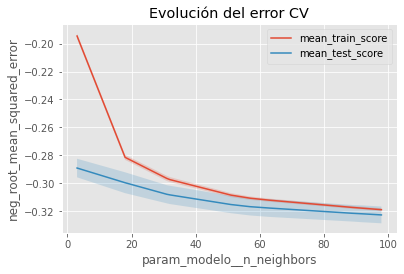

In [222]:
# Gráfico resultados validación cruzada para cada hiperparámetro
# ------------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(6, 3.84))
hiperparametro = 'param_modelo__n_neighbors'
resultados = resultados.sort_values(hiperparametro, ascending = False)
metrica    = grid.scoring

resultados.plot(hiperparametro, 'mean_train_score', ax=ax)
resultados.plot(hiperparametro, 'mean_test_score', ax=ax)
ax.fill_between(resultados[hiperparametro].astype(np.int),
                resultados['mean_train_score'] + resultados['std_train_score'],
                resultados['mean_train_score'] - resultados['std_train_score'],
                alpha=0.2)
ax.fill_between(resultados[hiperparametro].astype(np.int),
                resultados['mean_test_score'] + resultados['std_test_score'],
                resultados['mean_test_score'] - resultados['std_test_score'],
                alpha=0.2)
ax.legend()
ax.set_title('Evolución del error CV')
ax.set_ylabel(metrica)

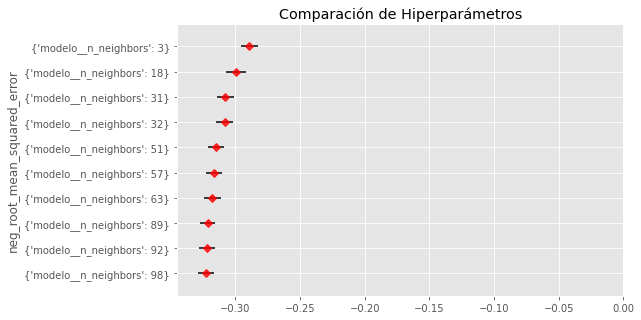

In [223]:
fig, ax = plt.subplots(figsize=(8, 5))

resultados = resultados.sort_values('mean_test_score', ascending = True)

ax.barh(
    [str(d) for d in resultados['params']],
    resultados['mean_test_score'],
    xerr=resultados['std_test_score'],
    align='center',
    alpha=0
)
ax.plot(
    resultados['mean_test_score'],
    [str(d) for d in resultados['params']],
    marker="D",
    linestyle="",
    alpha=0.8,
    color="r"
)
ax.set_title('Comparación de Hiperparámetros')
ax.set_ylabel(metrica);

In [224]:
from sklearn.metrics import mean_squared_error
# Error de test del modelo final
# ==============================================================================
modelo_final = grid.best_estimator_
predicciones = modelo_final.predict(X = X_test)
rmse_knn = mean_squared_error(
            y_true  = y_test,
            y_pred  = predicciones,
            squared = False
           )
print(f"El error (rmse) de test es: {rmse_knn}")

El error (rmse) de test es: 0.2691642641101088


In [225]:
from sklearn.model_selection import RandomizedSearchCV, RepeatedKFold
from sklearn.linear_model import Ridge

# Pipeline: preprocesado + modelo
# ==============================================================================
# Identificación de columnas numéricas y catégoricas
numeric_cols = X_train.select_dtypes(include=['float64', 'int64']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()


# Transformaciones para las variables numéricas
numeric_transformer = Pipeline(
                        steps=[('scaler', StandardScaler())]
                      )

# Transformaciones para las variables categóricas
categorical_transformer = Pipeline(
                            steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]
                          )

preprocessor = ColumnTransformer(
                    transformers=[
                        ('numeric', numeric_transformer, numeric_cols),
                        ('cat', categorical_transformer, cat_cols)
                    ],
                    remainder='passthrough'
                )

# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline.
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', Ridge())])

# Optimización de hiperparámetros
# ==============================================================================
# Espacio de búsqueda de cada hiperparámetro
param_distributions = {'modelo__alpha': np.logspace(-5, 5, 500)}

# Búsqueda random grid
grid = RandomizedSearchCV(
        estimator  = pipe,
        param_distributions = param_distributions,
        n_iter     = 20,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits = 5, n_repeats = 3), 
        refit      = True, 
        verbose    = 0,
        random_state = 123,
        return_train_score = True
       )

_=grid.fit(X = X_train, y = y_train)

# Resultados del grid
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)\
    .head(1)

,param_modelo__alpha,mean_test_score,std_test_score,mean_train_score,std_train_score
16,375.967,-0.333509,0.012232,-0.328278,0.001359
